<a href="https://colab.research.google.com/github/rishipython/Acute-Lymphocytic-Leukemia-ALL-Cell-Classification/blob/main/ALLCellClassification_Train_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [ ]:
import tensorflow as tf
import tensorflow.keras.layers as tfl
import tensorflow.keras as tfk
import tensorflow.keras.applications as tfa
import tensorflow.keras as keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import Input, Model
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from skimage.io import imread
from skimage.transform import resize
from keras.utils.vis_utils import plot_model
import json

In [ ]:
# set seed (so that results can be reproduced)
seed = 42
np.random.seed(seed)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
drive_dir = '/content/drive/MyDrive/'

In [ ]:
# Access GPU
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Fri Aug 13 13:58:09 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Access more memory
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
# See if Tensorflow is using GPU
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


# Get dataset

In [ ]:
# images are 450x450 (with 3 channels for RGB)
nx = 250
nh = 250
nc = 3
img_shape = (nx, nh, nc)
batch_size = 32

In [ ]:
def load_json_file(filename): # used to load normalization_parameters
  file = open(filename, "r")
  output = file.read()
  output = json.loads(output)
  file.close()
  return output

In [ ]:
train_x_files = np.load(drive_dir+"train_x_files.npy")
train_y = np.load(drive_dir+"train_y.npy")
val_x_files = np.load(drive_dir+"val_x_files.npy")
val_y = np.load(drive_dir+"val_y.npy")
test_x_files = np.load(drive_dir+"test_x_files.npy")
test_y = np.load(drive_dir+"test_y.npy")
normalization_params = load_json_file(drive_dir+"normalization_params.json") # loads normalization parameters (normalization parameters obtained from 
                                                                                     # https://colab.research.google.com/drive/1alGcMwDAwmTmZ_T6P3hme6pzdGV9ZaWF?usp=sharing)
mean = normalization_params['mean'] # mean of training set
std = normalization_params['std'] # standard deviation of training set

In [ ]:
# Loads batch of images from files
class ImageGenerator(tf.keras.utils.Sequence) :
  
  def __init__(self, image_files, labels, batch_size, mean, std, img_shape=img_shape) :
    self.x = image_files
    self.y = labels
    self.batch_size = batch_size
    self.mean = mean
    self.std = std
    self.img_shape = img_shape
    
    
  def __len__(self) :
    return (np.ceil(len(self.x)/float(self.batch_size))).astype(np.int)
  
  
  def __getitem__(self, i, preprocess=True) :
    batch_x = self.x[i*self.batch_size : (i+1)*self.batch_size]
    batch_y = self.y[i*self.batch_size : (i+1)*self.batch_size]
    
    if preprocess:
      return (np.array([
           resize((imread(file)-self.mean)/self.std, self.img_shape) for file in batch_x])), np.array(batch_y)
    
    else:
      return np.array([
            resize(imread(file), self.img_shape) for file in batch_x]), np.array(batch_y)

In [ ]:
train_gen = ImageGenerator(train_x_files, train_y, batch_size, mean, std) # image generator for training set
val_gen = ImageGenerator(val_x_files, val_y, batch_size, mean, std) # image generator for validation set
test_gen = ImageGenerator(test_x_files, test_y, batch_size, mean, std) # image generator for test set

In [ ]:
class_names = ['hem', 'all'] # names of classes

In [ ]:
def display_images_and_labels(image_gen, i=0, n_images=min(batch_size, 10), preprocess=False):
  images, labels = image_gen.__getitem__(i, preprocess)
  plt.figure(figsize=(50, 50))
  for j in range(n_images):
        ax = plt.subplot(10, 10, j + 1)
        plt.imshow(images[j])
        plt.title(class_names[labels[j]])
        plt.axis("off")

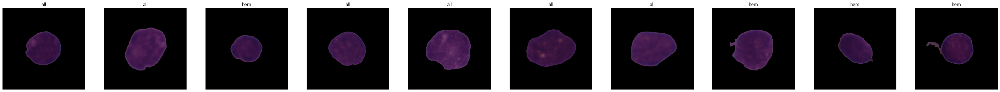

In [ ]:
display_images_and_labels(train_gen)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

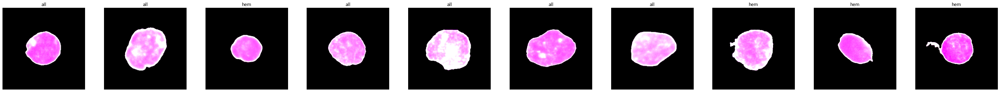

In [ ]:
display_images_and_labels(train_gen, preprocess=True)

# Make models

In [ ]:
def get_model(img_shape=img_shape, num_vgg_layers_freeze=10, num_resnet_layers_freeze=100, num_inception_layers_freeze=260, loss_function='binary_crossentropy', metrics='accuracy', lr=0.001):
  input = tfk.Input(shape=img_shape)

  inceptionv3 = tfa.InceptionV3(input_tensor=input, weights='imagenet', include_top=False)
  vgg16 = tfa.VGG16(input_tensor=input, weights='imagenet', include_top=False)
  resnet50 = tfa.ResNet50(input_tensor=input, weights='imagenet', include_top=False)

  for i in range(num_inception_layers_freeze):
    inceptionv3.layers[i].traiable = False

  for i in range(num_vgg_layers_freeze):
    vgg16.layers[i].trainable = False
  
  for i in range(num_resnet_layers_freeze):
    resnet50.layers[i].trainable = False

  vgg_conv1 = tfl.Conv2D(1024, kernel_size=1, strides=1, activation='relu', name='vgg_conv1')(vgg16.output)
  vgg_conv2 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='vgg_conv2')(vgg_conv1)
  vgg_padding = tfl.ZeroPadding2D()(vgg_conv2)
  vgg_pool = tfl.MaxPooling2D(pool_size=2, strides=2, name='vgg_pool')(vgg_padding)

  inception_conv1 = tfl.Conv2D(2048, kernel_size=2, strides=1, activation='relu', name='inception_conv1')(inceptionv3.output)
  inception_conv2 = tfl.Conv2D(2048, kernel_size=2, strides=1, activation='relu', name='inception_conv2')(inception_conv1)
  inception_conv3 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='inception_conv3')(inception_conv2)

  resnet_pool = tfl.MaxPooling2D(pool_size=2, strides=2, name='resnet_pool')(resnet50.output)
  resnet_conv1 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='resnet_conv1')(resnet_pool)
  resnet_conv2 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='resnet_conv2')(resnet_conv1)

  inception_midlayer_1 = inceptionv3.layers[17].output
  inception_midlayer_2 = inceptionv3.get_layer('mixed5').output

  inception_midlayer_1_pool = tfl.MaxPooling2D(pool_size=2, strides=2, name='inception_midlayer_1_pool')(inception_midlayer_1)
  inception_midlayer_1_conv1 = tfl.Conv2D(1024, kernel_size=2, strides=2, activation='relu', name='inception_midlayer_1_conv1')(inception_midlayer_1_pool)
  inception_midlayer_1_conv2 = tfl.Conv2D(2048, kernel_size=1, strides=2, activation='relu', name='inception_midlayer_1_conv2')(inception_midlayer_1_conv1)

  inception_midlayer_2_pool = tfl.MaxPooling2D(pool_size=2, strides=2, name='inception_midlayer_2_pool')(inception_midlayer_2)
  inception_midlayer_2_conv1 = tfl.Conv2D(1024, kernel_size=3, strides=1, activation='relu', name='inception_midlayer_2_conv1')(inception_midlayer_2_pool)
  inception_midlayer_2_conv2 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='inception_midlayer_2_conv2')(inception_midlayer_2_conv1)

  vgg_midlayer_1 = vgg16.get_layer('block1_pool').output
  vgg_midlayer_2 = vgg16.get_layer('block3_pool').output

  vgg_midlayer_1_pool = tfl.MaxPooling2D(pool_size=8, strides=4, name='vgg_midlayer_1_pool')(vgg_midlayer_1)
  vgg_midlayer_1_conv1 = tfl.Conv2D(512, kernel_size=2, strides=2, activation='relu', name='vgg_midlayer_1_conv1')(vgg_midlayer_1_pool)
  vgg_midlayer_1_conv2 = tfl.Conv2D(1024, kernel_size=2, strides=2, activation='relu', name='vgg_midlayer_1_conv2')(vgg_midlayer_1_conv1)
  vgg_midlayer_1_conv3 = tfl.Conv2D(2048, kernel_size=1, strides=2, activation='relu', name='vgg_midlayer_1_conv3')(vgg_midlayer_1_conv2)
  vgg_midlayer_1_conv4 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='vgg_midlayer_1_conv4')(vgg_midlayer_1_conv3)

  vgg_midlayer_2_pool = tfl.MaxPooling2D(pool_size=2, strides=2, name='vgg_midlayer_2_pool')(vgg_midlayer_2)
  vgg_midlayer_2_conv1 = tfl.Conv2D(512, kernel_size=2, strides=2, activation='relu', name='vgg_midlayer_2_conv1')(vgg_midlayer_2_pool)
  vgg_midlayer_2_padding = tfl.ZeroPadding2D()(vgg_midlayer_2_conv1)
  vgg_midlayer_2_conv2 = tfl.Conv2D(1024, kernel_size=2, strides=2, activation='relu', name='vgg_midlayer_2_conv2')(vgg_midlayer_2_padding)
  vgg_midlayer_2_conv3 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='vgg_midlayer_2_conv3')(vgg_midlayer_2_conv2)
  vgg_midlayer_2_conv4 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='vgg_midlayer_2_conv4')(vgg_midlayer_2_conv3)

  resnet_midlayer_1 = resnet50.get_layer('pool1_pool').output
  resnet_midlayer_2 = resnet50.get_layer('conv4_block1_add').output

  resnet_midlayer_1_pool = tfl.MaxPooling2D(pool_size=2, strides=2, name='resnet_midlayer_1_pool')(resnet_midlayer_1)
  resnet_midlayer_1_conv1 = tfl.Conv2D(256, kernel_size=2, strides=2, activation='relu', name='resnet_midlayer_1_conv1')(resnet_midlayer_1_pool)
  resnet_midlayer_1_conv2 = tfl.Conv2D(512, kernel_size=2, strides=2, activation='relu', name='resnet_midlayer_1_conv2')(resnet_midlayer_1_conv1)
  renset_midlayer_1_padding = tfl.ZeroPadding2D()(resnet_midlayer_1_conv2)
  resnet_midlayer_1_conv3 = tfl.Conv2D(1024, kernel_size=2, strides=2, activation='relu', name='resnet_midlayer_1_conv3')(renset_midlayer_1_padding)
  resnet_midlayer_1_conv4 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='resnet_midlayer_1_conv4')(resnet_midlayer_1_conv3)

  resnet_midlayer_2_pool = tfl.MaxPooling2D(pool_size=2, strides=2, name='resnet_midlayer_2_pool')(resnet_midlayer_2)
  resnet_midlayer_2_conv1 = tfl.Conv2D(2048, kernel_size=2, strides=2, activation='relu', name='resnet_midlayer_2_conv1')(resnet_midlayer_2_pool)
  resnet_midlayer_2_conv2 = tfl.Conv2D(2048, kernel_size=1, strides=1, activation='relu', name='resnet_midlayer_2_conv2')(resnet_midlayer_2_conv1)

  concatenate1 = tfl.Concatenate(axis=-1, name='concatenate1')([vgg_midlayer_1_conv4, vgg_midlayer_2_conv4, inception_midlayer_1_conv2, inception_midlayer_2_conv2, resnet_midlayer_1_conv4, resnet_midlayer_2_conv2])
  concatenate2 = tfl.Concatenate(axis=-1, name='concatenate2')([vgg_pool, inception_conv3, resnet_conv2])

  concatenate1_conv1 = tfl.Conv2D(6144, kernel_size=1, strides=1, activation='relu', name='concatenate1_conv1')(concatenate1)
  concatenate1_conv2 = tfl.Conv2D(3072, kernel_size=1, strides=1, activation='relu', name='concatenate1_conv2')(concatenate1_conv1)

  concatenate3 = tfl.Concatenate(axis=-1, name='concatenate3')([concatenate2, concatenate1_conv2])

  pool = tfl.MaxPooling2D(pool_size=3, strides=2, name='pool')(concatenate3)
  conv = tfl.Conv2D(1024, kernel_size=1, strides=1, name='conv')(pool)
  flatten = tfl.Flatten()(conv)

  fc1 = tfl.Dense(1024, activation='relu', name='fc1')(flatten)
  fc2 = tfl.Dense(1024, activation='relu', name='fc2')(fc1)

  output = tfl.Dense(1, activation='sigmoid', name='output')(fc2)

  model = tfk.models.Model(input, output, name="Model")

  model.compile(optimizer=Adam(learning_rate=lr), loss = loss_function, metrics = metrics)

  return model

In [ ]:
model = get_model()
print("Number of layers: " + str(len(model.layers)))
model.summary()
plot_model(model, to_file=drive_dir+'model.png', show_shapes=True, show_layer_names=True)

Number of layers: 550
Model: "Model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 250, 250, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 256, 256, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 125, 125, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 125, 125, 64) 256         conv1_conv[0][0]                 
________________________________________________________________________

In [ ]:
def get_inception(img_shape=img_shape, num_layers_freeze=260, loss_function='binary_crossentropy', metrics='accuracy', lr=0.001):
  if not isinstance(metrics, list):
    metrics = [metrics]
  
  inceptionv3 = InceptionV3(input_shape=img_shape, weights='imagenet', include_top=False)

  for i in range(num_layers_freeze):
    inceptionv3.layers[i].trainable = False

  avg_pool = GlobalAveragePooling2D(name='avg_pool')(inceptionv3.output)
  fc = Dense(512, activation='relu', name='fc')(avg_pool)

  output = Dense(1, activation='sigmoid', name='output')(fc)  

  model = Model(inceptionv3.input, output, name="Inception")

  model.compile(optimizer=Adam(learning_rate=lr), loss = loss_function, metrics = metrics)

  return model

In [ ]:
inception = get_inception()
print("Number of layers: " + str(len(inception.layers)))
inception.summary()
plot_model(inception, to_file=drive_dir+'inception.png', show_shapes=True, show_layer_names=True)

87916544/87910968 [==============================] - 1s 0us/step
Number of layers: 314
Model: "Inception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 250, 250, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 124, 124, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 124, 124, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 124, 124, 32) 0           batch_normalization[0][0]        
___

In [ ]:
def get_vgg(img_shape=img_shape, num_layers_freeze=10, loss_function='binary_crossentropy', metrics='accuracy', lr=0.001):
  if not isinstance(metrics, list):
    metrics = [metrics]
  
  vgg16 = VGG16(input_shape=img_shape, weights='imagenet', include_top=False)

  for i in range(num_layers_freeze):
    vgg16.layers[i].trainable = False

  conv1 = Conv2D(512, kernel_size=1, strides=1, activation='relu', name='conv1')(vgg16.output)
  conv2 = Conv2D(512, kernel_size=1, strides=1, activation='relu', name='conv2')(conv1)
  pool = MaxPooling2D(pool_size=2, strides=2, name='pool')(conv2)
  
  flatten = Flatten(name='flatten')(pool)
  fc1 = Dense(4096, activation='relu', name='fc1')(flatten)
  fc2 = Dense(2048, activation='relu', name='fc2')(fc1)
  fc3 = Dense(1024, activation='relu', name='fc3')(fc2)
  fc4 = Dense(512, activation='relu', name='fc4')(fc3)
  fc5 = Dense(144, activation='relu', name='fc5')(fc4)
  
  output = Dense(1, activation='sigmoid', name='output')(fc5)

  model = Model(vgg16.input, output, name="VGG")

  model.compile(optimizer=Adam(learning_rate=lr), loss = loss_function, metrics = metrics)

  return model

58892288/58889256 [==============================] - 0s 0us/step
Number of layers: 29
Model: "VGG"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 250, 250, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 250, 250, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 250, 250, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 125, 125, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 125, 125, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 125, 125, 128)     147584    
___________________________________________

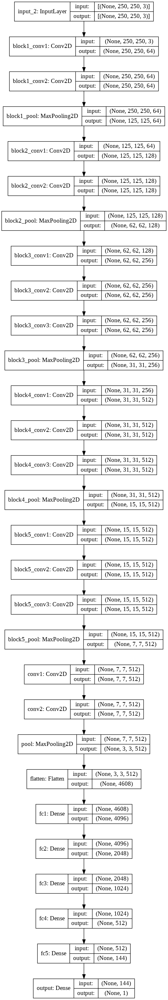

In [ ]:
vgg = get_vgg()
print("Number of layers: " + str(len(vgg.layers)))
vgg.summary()
plot_model(vgg, to_file=drive_dir+'vgg.png', show_shapes=True, show_layer_names=True)

In [ ]:
def get_resnet(img_shape=img_shape, num_layers_freeze=100, loss_function='binary_crossentropy', metrics='accuracy', lr=0.001):
  if not isinstance(metrics, list):
    metrics = [metrics]
  
  resnet50 = tf.keras.applications.ResNet50(input_shape=img_shape, weights='imagenet', include_top=False)

  for i in range(num_layers_freeze):
    resnet50.layers[i].trainable = False

  avg_pool = tfl.GlobalAveragePooling2D(name='avg_pool')(resnet50.output)
  fc = tfl.Dense(512, activation='relu', name='fc')(avg_pool)

  output = tfl.Dense(1, activation='sigmoid', name='output')(fc)

  model = tf.keras.models.Model(resnet50.input, output, name="ResNet")

  model.compile(optimizer=Adam(learning_rate=lr), loss = loss_function, metrics = metrics)

  return model

94773248/94765736 [==============================] - 1s 0us/step
Number of layers: 178
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 250, 250, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 256, 256, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 125, 125, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 125, 125, 64) 256         conv1_conv[0][0]                 
______

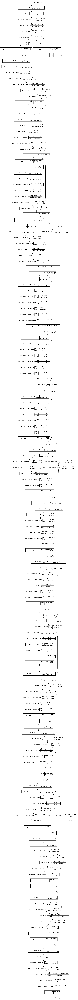

In [ ]:
resnet = get_resnet()
print("Number of layers: " + str(len(resnet.layers)))
resnet.summary()
plot_model(resnet, to_file=drive_dir+'resnet.png', show_shapes=True, show_layer_names=True)

# Train models

In [ ]:
epochs = 40
def checkpoint(name):
  return [tfk.callbacks.ModelCheckpoint(name, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')]
class_weight = {0: np.sum(train_y)/(len(train_y) - np.sum(train_y)),
                1: 1.0}

In [ ]:
print(f"Number of training examples: {len(train_y)}")
print(f"Number of positive (all) examples: {np.sum(train_y)}")
print(f"Number of negative (hem) examples: {len(train_y) - np.sum(train_y)}")
print(f"Class weight: {class_weight}")

Number of training examples: 6414
Number of positive (all) examples: 4326
Number of negative (hem) examples: 2088
Class weight: {0: 2.07183908045977, 1: 1.0}


In [ ]:
model_history = model.fit(x=train_gen, epochs=epochs, validation_data=val_gen, callbacks=checkpoint(drive_dir+"Model"), class_weight=class_weight)

In [ ]:
model_history_file = open(drive_dir+"model_history.json", "w")
json.dump(model_history.history, model_history_file)
model_history_file.close()

In [ ]:
inception_history = inception.fit(x=train_gen, epochs=epochs, validation_data=val_gen, callbacks=checkpoint(drive_dir+"Inception"), class_weight=class_weight)

In [ ]:
inception_history_file = open(drive_dir+"inception_history.json", "w")
json.dump(inception_history.history, inception_history_file)
inception_history_file.close()

In [ ]:
vgg_history = vgg.fit(x=train_gen, epochs=epochs, validation_data=val_gen, callbacks=checkpoint(drive_dir+"VGG"), class_weight=class_weight)

In [ ]:
vgg_history_file = open(drive_dir+"vgg_history.json", "w")
json.dump(vgg_history.history, vgg_history_file)
vgg_history_file.close()

In [ ]:
resnet_history = resnet.fit(x=train_gen, epochs=epochs, validation_data=val_gen, callbacks=checkpoint(drive_dir+"ResNet"), class_weight=class_weight)

In [ ]:
resnet_history_file = open(drive_dir+"resnet_history.json", "w")
json.dump(resnet_history.history, resnet_history_file)
resnet_history_file.close()